In [21]:
# Selecting libraries
import yfinance as yf
import pandas as pd
import numpy as np
import pyfolio as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings("ignore")

import cvxopt as opt
from cvxopt import blas, solvers

In [22]:
# Define the assets and key initial metrics as investment amount to generate a portfolio


stocks = ['AAPL', 'MSFT', 'NVDA', 'JNJ', 'NVS','JPM','GS','AMZN','DIS','MCD','NEE','BA','CAT','XOM','CVX','RIO','BHP']
portfolio_value = 10**6                         # Initial Portfolio Value to be allocated in full
weights = [1/len(stocks)]*len(stocks)        # Weight Allocation per asset

benchmark = '^GSPC'                    # Which is your benchmark? ^GSPC is SP500 for Yfinance library

start_date = '2009-01-01'              # Start date for asset data download
live_date = '2023-01-01'               # Portfolio LIVE start date (for analytics)


# Warning handling
if len(weights) != len(stocks):
    print(sum((np.array(weights))))
    print('Number of Asset does not match weight allocated')
    
weight = round(sum((np.array(weights))))
if weight != 1.0:
    print(sum((np.array(weights))))
    print('Weight could not be allocated properly, make sure they sum 1.0')


In [23]:
# Download data, clean and isolate values for calculation
# If you use other data source, make sure the format is the same than stock_data.head() on next cell. Check dtypes by stock_data.info()

stock_data = yf.download(stocks, start=start_date)['Adj Close']
stock_data = stock_data.dropna()
stock_data = stock_data.reindex(columns=stocks)
stock_prices = stock_data[stocks].values

[*********************100%***********************]  17 of 17 completed


In [24]:
shares_df = pd.DataFrame(index=[stock_data.index[0]])

for s,w in zip(stocks, weights):
    shares_df[s + '_shares'] = np.floor((portfolio_value * np.array(w)) / stock_data[s][0])

shares_df    

,AAPL_shares,MSFT_shares,NVDA_shares,JNJ_shares,NVS_shares,JPM_shares,GS_shares,AMZN_shares,DIS_shares,MCD_shares,NEE_shares,BA_shares,CAT_shares,XOM_shares,CVX_shares,RIO_shares,BHP_shares
2009-01-02,21353.0,3888.0,29443.0,1485.0,2329.0,2688.0,855.0,21642.0,2855.0,1395.0,6984.0,1733.0,1872.0,1233.0,1359.0,6346.0,2555.0


In [25]:
import pandas as pd
import numpy as np
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

# Set the number of assets, assumed that 'df' is your DataFrame with historical prices.
df = stock_data.copy()
num_assets = len(df.columns)
stocks = df.columns

# Create an empty DataFrame to store the portfolio weights over time
optimal_weights_df = pd.DataFrame(index=df.index, columns=stocks)

# Set the window length for the rolling covariance calculation
window_length = 252  # Use 252 for approx one year of trading days

# Set the initial weights to be equal for all assets
initial_weights = np.array([1/num_assets]*num_assets)

for end_date in df.index[window_length:]:
    
    # Extract the window of data
    data_window = df.loc[:end_date].tail(window_length)
    
    # Calculate expected returns and covariance matrix for the window
    mu = expected_returns.mean_historical_return(data_window)
    S = risk_models.sample_cov(data_window)

    # Initialise and optimize the portfolio on the window of data
    ef = EfficientFrontier(mu, S, weight_bounds=(0, 1))  # Set bounds to allow shorting
    raw_weights = ef.max_sharpe()  # Optimize for maximal Sharpe ratio
    cleaned_weights = ef.clean_weights()  # Clean the raw weights
    
    # Add the weights to our optimal_weights dataframe
    optimal_weights_df.loc[end_date] = [cleaned_weights.get(stock) for stock in stocks]

# Forward fill the weights for the days we aren't rebalancing
optimal_weights_df = optimal_weights_df.fillna(method='ffill')

# Print out the final DataFrame
print(optimal_weights_df.tail())


            AAPL  MSFT     NVDA  JNJ      NVS  JPM   GS  AMZN  DIS  MCD  NEE  \
Date                                                                           
2023-07-06   0.0   0.0  0.51109  0.0  0.43943  0.0  0.0   0.0  0.0  0.0  0.0   
2023-07-07   0.0   0.0  0.58277  0.0  0.36313  0.0  0.0   0.0  0.0  0.0  0.0   
2023-07-10   0.0   0.0  0.52334  0.0  0.39138  0.0  0.0   0.0  0.0  0.0  0.0   
2023-07-11   0.0   0.0  0.52354  0.0  0.35072  0.0  0.0   0.0  0.0  0.0  0.0   
2023-07-12   0.0   0.0  0.52901  0.0  0.37538  0.0  0.0   0.0  0.0  0.0  0.0   

                 BA      CAT      XOM  CVX  RIO  BHP  
Date                                                  
2023-07-06  0.00000  0.00000  0.04949  0.0  0.0  0.0  
2023-07-07  0.01358  0.00000  0.04052  0.0  0.0  0.0  
2023-07-10  0.01640  0.02907  0.03981  0.0  0.0  0.0  
2023-07-11  0.03464  0.07491  0.01619  0.0  0.0  0.0  
2023-07-12  0.00000  0.04537  0.05024  0.0  0.0  0.0  


In [26]:
start_date = df.index[window_length]
stock_data = stock_data.loc[start_date:]
shares_df = shares_df.loc[start_date:]
optimal_weights_df = optimal_weights_df.loc[start_date:]


In [27]:
shares_df = pd.DataFrame(index=[stock_data.index[0]])

for s,w in zip(stocks, weights):
    shares_df[s + '_shares'] = np.floor((portfolio_value * np.array(w)) / stock_data[s][0])

shares_df    

,AAPL_shares,MSFT_shares,NVDA_shares,JNJ_shares,NVS_shares,JPM_shares,GS_shares,AMZN_shares,DIS_shares,MCD_shares,NEE_shares,BA_shares,CAT_shares,XOM_shares,CVX_shares,RIO_shares,BHP_shares
2010-01-04,9054.0,2495.0,13869.0,1348.0,2100.0,1956.0,423.0,8786.0,2105.0,1368.0,6541.0,1343.0,1437.0,1423.0,1267.0,2317.0,1412.0


In [28]:
# initialize variables
balance_year = stock_data.index[0].year
balance_month = stock_data.index[0].month
signal = False
count = 0    # for loop count purpose

# Store previous values in a dictionary
prev_values = {}

# Calculate portfolio value for the first day
portfolio_value = sum([shares_df.loc[stock_data.index[0], s + '_shares'] * stock_data.loc[stock_data.index[0], s] for s in stocks])

for day in stock_data.index:
    count += 1
    if day == stock_data.index[0]:
        shares_df.loc[day] = shares_df.loc[day] # First day

        # Store initial values as previous values
        for col in shares_df.columns:
            prev_values[col] = shares_df.loc[day, col]


    elif day.month != balance_month:
        signal = True

        # get the weights for the current period
        weights = optimal_weights_df.loc[day]

        # calculate new shares based on the new portfolio value and weights
        new_shares = [np.floor((portfolio_value * w) / stock_data[s][day]) for s,w in zip(stocks, weights)]
        shares_df.loc[day, :] = new_shares

        balance_year = day.year
        balance_month = day.month
        count += 1

        # Store new values as previous values
        for col in shares_df.columns:
            prev_values[col] = shares_df.loc[day, col]

    else:

        signal = False

        # Use previous values if it is not a rebalancing date
        shares_df.loc[day, :] = [prev_values[col] for col in shares_df.columns]

    # Calculate asset values and portfolio value for the current day
    asset_values = [shares_df.loc[day, s + '_shares'] * stock_data.loc[day, s] for s in stocks]
    portfolio_value = sum(asset_values)
    
    stock_data.loc[day, 'Signal'] = signal
    stock_data.loc[day, 'Portfolio_Value'] = portfolio_value
    
    # Add shares to stock data frame
    for s in stocks:
        stock_data.loc[day, s + '_shares'] = shares_df.loc[day, s + '_shares']
        stock_data.loc[day, s + '_value'] = shares_df.loc[day, s + '_shares'] * stock_data.loc[day, s]


In [29]:
# Calculate log returns for portfolio
stock_data['Portfolio_Value_rets'] = np.log(stock_data['Portfolio_Value'] / stock_data['Portfolio_Value'].shift(1))

# Calculate log returns for each stock
for stock in stocks:
    stock_data[f'{stock}_rets'] = np.log(stock_data[stock] / stock_data[stock].shift(1))

In [30]:
start_date_benchmark = stock_data.index[0]
stock_data = stock_data.dropna()

In [31]:
# Calculate daily weight per asset
for s in stocks:
    stock_data[s + '_weight'] = stock_data[s + '_value'] / stock_data['Portfolio_Value']

In [32]:
stock_data.filter(regex='weight')

,AAPL_weight,MSFT_weight,NVDA_weight,JNJ_weight,NVS_weight,JPM_weight,GS_weight,AMZN_weight,DIS_weight,MCD_weight,NEE_weight,BA_weight,CAT_weight,XOM_weight,CVX_weight,RIO_weight,BHP_weight
Date,,,,,,,,,,,,,,,,,
2010-01-05,0.058597,0.058510,0.059353,0.057818,0.058432,0.059635,0.059426,0.058846,0.058334,0.058047,0.057926,0.060387,0.059201,0.058704,0.058878,0.059414,0.058491
2010-01-06,0.057507,0.057992,0.059569,0.058128,0.058062,0.059798,0.058631,0.057622,0.057865,0.057098,0.058337,0.062048,0.059218,0.059049,0.058725,0.061058,0.059291
2010-01-07,0.057363,0.057351,0.058364,0.057676,0.057514,0.060943,0.059739,0.056604,0.057845,0.057479,0.058135,0.064518,0.059419,0.058825,0.058465,0.061029,0.058732
2010-01-08,0.057586,0.057589,0.058329,0.057715,0.057820,0.060626,0.058449,0.057978,0.057777,0.057266,0.057473,0.063720,0.059921,0.058429,0.058408,0.061538,0.059375
2010-01-11,0.057051,0.056829,0.057485,0.057697,0.058831,0.060394,0.057499,0.056557,0.056808,0.057683,0.057403,0.062935,0.063654,0.059056,0.059416,0.060975,0.059726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-06,0.000000,0.000000,0.541120,0.000000,0.429188,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.029691,0.000000,0.000000,0.000000
2023-07-07,0.000000,0.000000,0.551307,0.000000,0.418657,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030035,0.000000,0.000000,0.000000
2023-07-10,0.000000,0.000000,0.544776,0.000000,0.424874,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030350,0.000000,0.000000,0.000000


In [33]:
fig = go.Figure()

# Loop through each stock and add a trace for its shares
for stock in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=shares_df[stock+'_shares'], mode='lines', name=stock+'_shares'))

fig.update_layout(title='Shares per day',
                  xaxis_title='Date',
                  yaxis_title='Shares',
                  width=800,
                  height=400)

fig.show()

In [34]:
fig = go.Figure()

# Loop through each stock and add a trace for its shares
for stock in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[stock + '_weight'], mode='lines', name=stock + '_weight'))

fig.update_layout(title='Weights per day',
                  xaxis_title='Date',
                  yaxis_title='Weights',
                  width=1000,
                  height=600)

fig.show()

In [35]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create subplot layout
fig = make_subplots(rows=2, cols=2, subplot_titles=('Portfolio Returns', 'Asset Returns', 'Shares Holding per Asset', 'Weights per Asset'))

# Add traces to the subplots
fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data['Portfolio_Value_rets'].cumsum(), name='Portfolio'), row=1, col=1)

for s in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[f'{s}_rets'].cumsum(), name=f'{s}'), row=1, col=2)
    fig.add_trace(go.Scatter(x=shares_df.index, y=shares_df[f'{s}_shares'], name=f'{s}'), row=2, col=1)
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[f'{s}_weight'], name=f'{s}'), row=2, col=2)

# Update subplot layout
fig.update_layout(height=800, width=1200, title='Strategy Overview', showlegend=False)

# Display the plot
fig.show()


In [36]:
# Benchmark data download and returns
start_date_benchmark = stock_data.index[0]
benchmark_data = yf.download(benchmark, start=start_date_benchmark)
benchmark_data = benchmark_data.dropna()
benchmark_data['benchmark_rets'] = np.log(benchmark_data['Adj Close'] / benchmark_data['Adj Close'].shift(1))
benchmark_data['benchmark_rets'] = benchmark_data['benchmark_rets'].dropna()

[*********************100%***********************]  1 of 1 completed


In [37]:
# Data timezone unification for pyfolio valuation
if stock_data.index.tz is None:
    stock_data.index = stock_data.index.tz_localize('UTC')
else:
    stock_data.index = stock_data.index.tz_convert('UTC')

if benchmark_data.index.tz is None:
    benchmark_data.index = benchmark_data.index.tz_localize('UTC')
else:
    benchmark_data.index = benchmark_data.index.tz_convert('UTC')

# Convert live_date to a datetime object, then localize or convert as needed.
live_date = pd.to_datetime(live_date)
if live_date.tzinfo is None:
    live_date = live_date.tz_localize('UTC')
else:
    live_date = live_date.tz_convert('UTC')



Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,39.86,2020-02-18,2020-03-23,2020-05-18,65
1,31.71,2020-09-02,2022-07-14,NaT,NaN
2,28.48,2018-08-29,2018-12-24,2019-12-06,333
3,20.27,2015-12-29,2016-02-08,2016-07-07,138
4,19.47,2015-04-27,2015-08-24,2015-10-23,130


AttributeError: 'Axes' object has no attribute 'is_last_row'

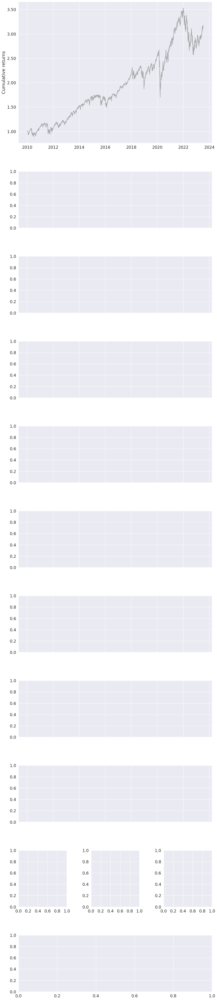

In [38]:
py.create_full_tear_sheet(stock_data['Portfolio_Value_rets'], benchmark_rets = benchmark_data['benchmark_rets'], live_start_date = live_date)